In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
pd.set_option('display.max_columns', None)

# 1. Data Exploration

In [2]:
metadata = pd.read_csv('metadata.csv')
metadata.head()

,Source,Location ID,City,State,Country,Latitude,Longitude,Time Zone,Elevation,Local Time Zone,Clearsky DHI Units,Clearsky DNI Units,Clearsky GHI Units,Dew Point Units,DHI Units,DNI Units,GHI Units,Solar Zenith Angle Units,Temperature Units,Pressure Units,Relative Humidity Units,Precipitable Water Units,Wind Direction Units,Wind Speed Units,Cloud Type -15,Cloud Type 0,Cloud Type 1,Cloud Type 2,Cloud Type 3,Cloud Type 4,Cloud Type 5,Cloud Type 6,Cloud Type 7,Cloud Type 8,Cloud Type 9,Cloud Type 10,Cloud Type 11,Cloud Type 12,Fill Flag 0,Fill Flag 1,Fill Flag 2,Fill Flag 3,Fill Flag 4,Fill Flag 5,Surface Albedo Units,Version
0,NSRDB,95435,-,-,-,35.25,-119.26,-8,100,-8,w/m2,w/m2,w/m2,c,w/m2,w/m2,w/m2,Degree,c,mbar,%,cm,Degrees,m/s,NaN,Clear,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,Unknown,Dust,Smoke,NaN,Missing Image,Low Irradiance,Exceeds Clearsky,Missing CLoud Properties,Rayleigh Violation,NaN,3.1.0


In [69]:
df = pd.read_csv('dataset.csv', parse_dates=True)
df = df.drop(columns=['Year.1', 'Month.1', 'Day.1', 'Hour.1','Minute'])
df = df.rename(columns={"Solar Zenith Angle":"Solar Zenith","WIND TOTAL": "WIND", "Global Horizontal UV Irradiance (280-400nm)": "Horizontal UVI<400nm", "Global Horizontal UV Irradiance (295-385nm)": "Horizontal UVI<385nm"})
# Filter and Re-order
df["SOLAR"] = df["SOLAR PV"] + df["SOLAR THERMAL"]
df['Date'] = df[['Year', 'Month', 'Day']].astype(str).agg('-'.join, axis=1) + ' ' + df['Hour'].astype(str) + ':00:00'
df['Date'] = pd.to_datetime(df['Date'].astype(str))
df = df[[
'Date',
'Year',
'Month',
'Day',
'Hour',
'DHI',
'DNI',
'GHI',
'Clearsky DHI',
'Clearsky DNI',
'Clearsky GHI',
'Horizontal UVI<400nm',
'Horizontal UVI<385nm',
'Solar Zenith',
'Cloud Type',
'Fill Flag',
'Dew Point',
'Surface Albedo',
'Precipitable Water',
'Relative Humidity',
'Temperature',
'Wind Speed',
'Wind Direction',
'Pressure',
'WIND',
'SOLAR',
'SOLAR PV',
'SOLAR THERMAL',
'GEOTHERMAL',
'BIOMASS',
'BIOGAS',
'SMALL HYDRO',
'HYDRO',
'NUCLEAR',
'THERMAL',
'IMPORTS',
'RENEWABLES',
]]
df.set_index(['Date'], inplace=True)
df_small = df[['Year', 'Month', 'Day', 'Hour', 'SOLAR', 'WIND']]
df_search = df_small.query("`Year` < 2019 and `Month` < 9")
df.head()

,Year,Month,Day,Hour,DHI,DNI,GHI,Clearsky DHI,Clearsky DNI,Clearsky GHI,Horizontal UVI<400nm,Horizontal UVI<385nm,Solar Zenith,Cloud Type,Fill Flag,Dew Point,Surface Albedo,Precipitable Water,Relative Humidity,Temperature,Wind Speed,Wind Direction,Pressure,WIND,SOLAR,SOLAR PV,SOLAR THERMAL,GEOTHERMAL,BIOMASS,BIOGAS,SMALL HYDRO,HYDRO,NUCLEAR,THERMAL,IMPORTS,RENEWABLES
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-06-01 00:00:00,2018,6,1,0,0,0,0,0,0,0,2018.0,6.0,0.00,0,0.25,6.100122.08,1.5,61.6,1001,0.0,1.200283,13.3,0.0,0,8252.0,6014,2238.0,245,357,4061,0,NaN,7861.0,3315.0,NaN,2785.0
2018-06-01 01:00:00,2018,6,1,1,0,0,0,0,0,0,6.0,1.0,0.00,0,0.25,6.30118.4,1.2001.200284,12.4,0.0,0.0,66.47,1001,2018.0,6030,4818.0,2238,2580.0,356,4078,0,0,NaN,3071.0,NaN,NaN,7380.0
2018-06-01 02:00:00,2018,6,1,2,0,0,0,0,0,0,2018.0,6.0,111.90,0,0,6.4,0.25,1.200286,11.701002,0.0,1,70.17,0.0,0,7113.0,4864,2249.0,245,355,3915,0,NaN,7324.0,3181.0,NaN,3137.0
2018-06-01 03:00:00,2018,6,1,3,0,0,0,0,0,0,2018.0,6.0,103.31,0,0,6.5,0.25,1.200286,11.201002,0.0,0.9,72.7,0.0,0,8105.0,5835,2270.0,245,359,3877,0,NaN,7406.0,3203.0,NaN,1846.0
2018-06-01 04:00:00,2018,6,1,4,0,0,0,0,0,0,2018.0,6.0,93.26,0,0,6.5,0.25,1.200280,11.701002,0.0,1,70.29,0.0,0,7913.0,5644,2269.0,246,359,3689,0,NaN,8091.0,3274.0,NaN,1697.0


### Check average and summation using query for a certain period

In [34]:
a = df.query("`Day` < 10 and `Day` >= 1 and `Month` == 6 and `Year` == 2018")
df['SOLAR PV'].agg(['sum','average'])

sum        7.818824e+07
average    3.451105e+03
Name: SOLAR PV, dtype: float64

### Plot

(1.0, 31.0)

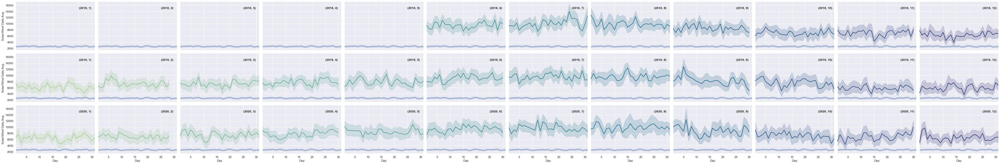

In [164]:
# Plot each month's time series in its own facet
g = sns.relplot(
    data=df_small,
    x="Day", y="SOLAR", col="Month", hue="Month", row="Year",
    kind="line", palette="crest", linewidth=2, zorder=5,
    height=3, aspect=1.5, legend=False,
)
for year, ax in g.axes_dict.items():
    ax.text(.8, .85, year, transform=ax.transAxes, fontweight="bold")
    sns.lineplot(
        data=df_small, x="Day", y="WIND",
        estimator="mean", linewidth=1, ax=ax,
    )

g.set_titles("")
g.set_axis_labels("Day", "Solar/Wind Daily Avg.")
g.tight_layout()
ax.set_xlim(1,31)

<AxesSubplot:>

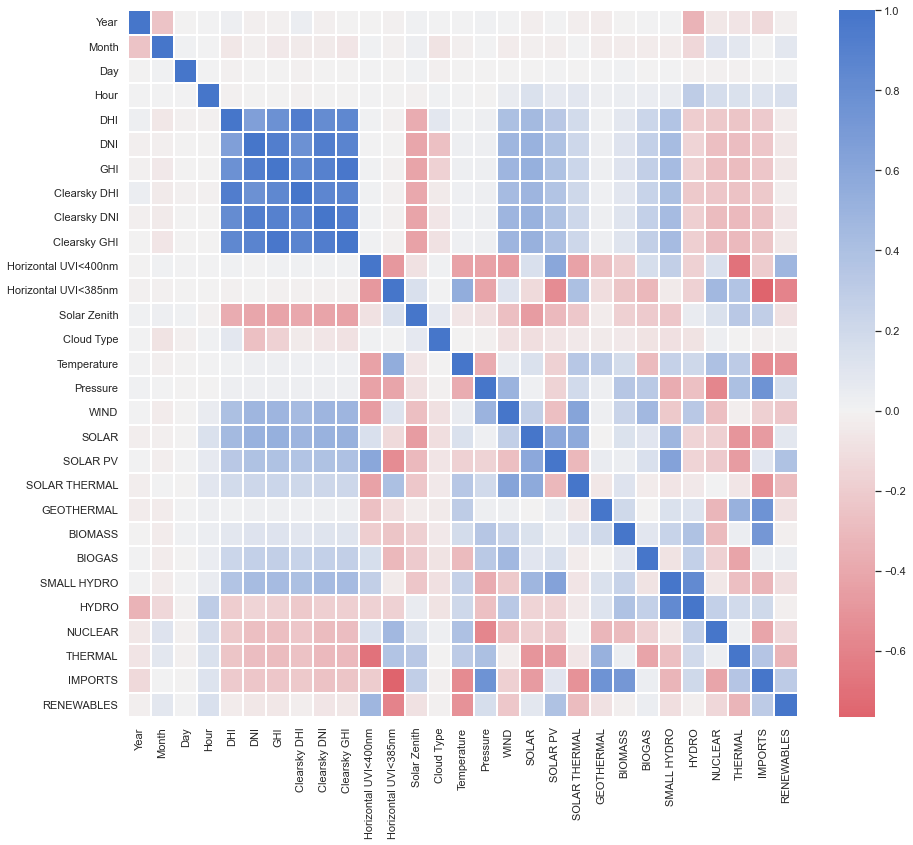

In [51]:
# Compute the correlation matrix
corr = df.corr()
f, ax = plt.subplots(figsize=(15, 13))
cmap = sns.diverging_palette(10, 255, as_cmap=True)
sns.heatmap(corr, cmap=cmap, center=0, linewidths=2)

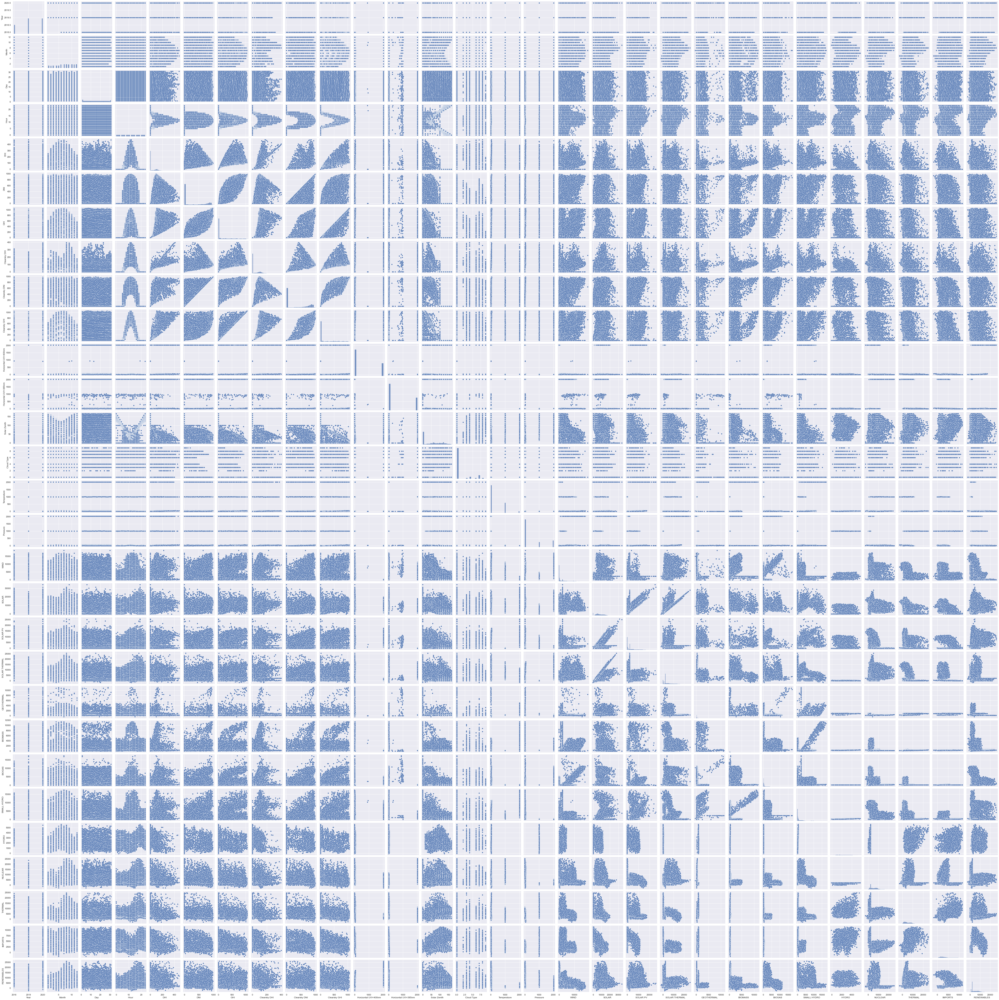

In [166]:
sns.pairplot(df)

### Prediction using LSTM

<AxesSubplot:xlabel='Date'>

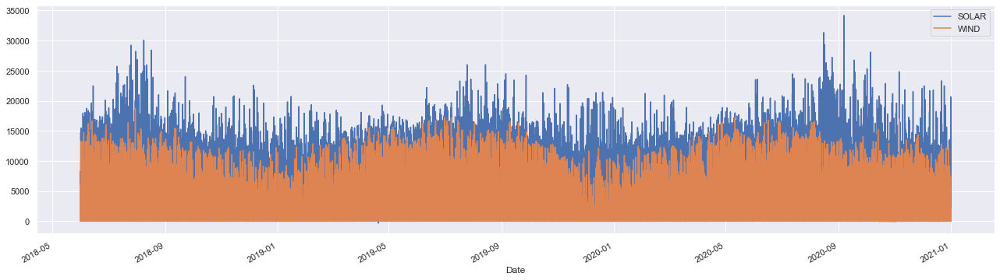

In [60]:
df[['SOLAR','WIND']].plot(figsize=(22, 6))

<AxesSubplot:xlabel='Date'>

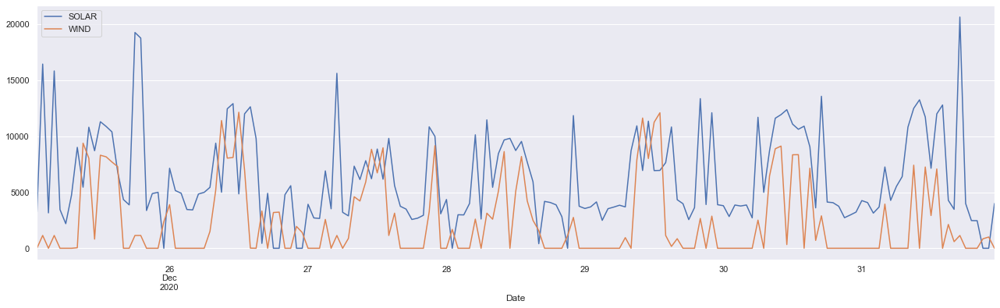

In [64]:
df.query("`Date` > '2020-12-25'")[['SOLAR', 'WIND']].plot(figsize=(22, 6))

In [66]:
df.query("`Date` < '2018-06-02'")

,Year,Month,Day,Hour,DHI,DNI,GHI,Clearsky DHI,Clearsky DNI,Clearsky GHI,Horizontal UVI<400nm,Horizontal UVI<385nm,Solar Zenith,Cloud Type,Fill Flag,Dew Point,Surface Albedo,Precipitable Water,Relative Humidity,Temperature,Wind Speed,Wind Direction,Pressure,WIND,SOLAR,SOLAR PV,SOLAR THERMAL,GEOTHERMAL,BIOMASS,BIOGAS,SMALL HYDRO,HYDRO,NUCLEAR,THERMAL,IMPORTS,RENEWABLES
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-06-01 00:00:00,2018,6,1,0,0,0,0,0,0,0,2018.0000,6.0000,0.00,0,0.25,6.100122.08,1.5,61.6,1001,0.000000,1.200283,13.3,0.0000,0,8252.0,6014,2238.0,245,357,4061,0,NaN,7861.0,3315.0,NaN,2785.0
2018-06-01 01:00:00,2018,6,1,1,0,0,0,0,0,0,6.0000,1.0000,0.00,0,0.25,6.30118.4,1.2001.200284,12.4,0.0,0.000000,66.47,1001,2018.0000,6030,4818.0,2238,2580.0,356,4078,0,0,NaN,3071.0,NaN,NaN,7380.0
2018-06-01 02:00:00,2018,6,1,2,0,0,0,0,0,0,2018.0000,6.0000,111.90,0,0,6.4,0.25,1.200286,11.701002,0.000000,1,70.17,0.0000,0,7113.0,4864,2249.0,245,355,3915,0,NaN,7324.0,3181.0,NaN,3137.0
2018-06-01 03:00:00,2018,6,1,3,0,0,0,0,0,0,2018.0000,6.0000,103.31,0,0,6.5,0.25,1.200286,11.201002,0.000000,0.9,72.7,0.0000,0,8105.0,5835,2270.0,245,359,3877,0,NaN,7406.0,3203.0,NaN,1846.0
2018-06-01 04:00:00,2018,6,1,4,0,0,0,0,0,0,2018.0000,6.0000,93.26,0,0,6.5,0.25,1.200280,11.701002,0.000000,1,70.29,0.0000,0,7913.0,5644,2269.0,246,359,3689,0,NaN,8091.0,3274.0,NaN,1697.0
2018-06-01 05:00:00,2018,6,1,5,49,310,91,49,310,91,0.0000,2018.0000,82.13,0,0,6.4,0.25,287,13.8,1003.000000,1.4001.3,61.14,0.0000,0,5212.0,0,5212.0,354,245,489,3123,NaN,2017.0,8812.0,3529.0,2271.0
2018-06-01 06:00:00,2018,6,1,6,82,613,286,82,613,286,14.5703,11.2753,70.54,0,0,6.2,0.25,1.3,49.92,16.700000,1.8,304,1003.0000,2650,1643.0,1628,15.0,998,359,245,533,3475.0,2276.0,2108.0,8767.0,6428.0
2018-06-01 07:00:00,2018,6,1,7,101,760,498,101,760,498,2018.0000,6.0000,0.00,0,0.25,5.8058.5,2.1,40.36,1003,27.689500,1.400314,19.6,21.6436,230,11876.0,9602,2274.0,245,535,1827,5406,NaN,7060.0,3060.0,NaN,2045.0
2018-06-01 08:00:00,2018,6,1,8,114,842,696,114,842,696,2018.0000,6.0000,46.28,0,0,5.4,0.25,1.400322,22.401004,40.716700,2.5,33.21,31.9598,476,13961.0,11688,2273.0,243,462,1140,8011,NaN,6050.0,2562.0,NaN,1820.0


In [54]:
from statsmodels.tsa.seasonal import seasonal_decompose
results = seasonal_decompose(df[['WIND','SOLAR']], period = 30)
results.plot()

ValueError: This function does not handle missing values